In [1]:
import utils
import requests

text_by_file = utils.load_files('./ustawy/*')

1. Use the corpus from exercise no. 1 or any other Polish corpus of comparable size.
2. Make sure the texts in the corpus does not contain HTML code.
3. Use SpaCy [tokenizer API](https://spacy.io/api/tokenizer) to tokenize the text from the cleaned law corpus.

In [5]:
from spacy.tokenizer import Tokenizer
from spacy.lang.pl import Polish

for file,text in text_by_file.items():
    text_by_file[file] = ' '.join(text.split())
    

nlp = Polish()
tokenizer = nlp.tokenizer
files = tokenizer.pipe(text_by_file.values())

4. Compute **frequency list** for each of the processed files.

In [6]:
from collections import Counter

frequencies = {}

for file,doc in zip(text_by_file.keys(),files):
    words = [token.text for token in doc]
    freq = Counter(words)
    frequencies[file] = freq

frequencies

{'./ustawy/2000_381.txt': Counter({'Dz': 2,
          '.': 25,
          'U': 2,
          'z': 4,
          '2000': 2,
          'r': 4,
          'Nr': 2,
          '31': 1,
          ',': 2,
          'poz': 2,
          '381': 1,
          'USTAWA': 1,
          'dnia': 3,
          '2': 4,
          'marca': 1,
          'o': 3,
          'zmianie': 1,
          'ustawy': 1,
          'przeciwdziałaniu': 2,
          'praktykom': 2,
          'monopolistycznym': 2,
          'i': 3,
          'ochronie': 2,
          'interesów': 2,
          'konsumentów': 2,
          'Art': 2,
          '1': 1,
          'W': 1,
          'ustawie': 1,
          '24': 1,
          'lutego': 1,
          '1990': 1,
          '(': 1,
          '1999': 1,
          '52': 1,
          '547': 1,
          ')': 4,
          'w': 4,
          'art': 1,
          '17': 1,
          'wprowadza': 1,
          'się': 3,
          'następujące': 1,
          'zmiany': 1,
          ':': 3,
          'a': 1,

5. Aggregate the result to obtain one global frequency list.

In [7]:
from functools import reduce

agg = reduce(lambda a,b: a+b, frequencies.values())
agg

Counter({'Dz': 8884,
         '.': 437694,
         'U': 8320,
         'z': 81531,
         '2000': 2385,
         'r': 33052,
         'Nr': 43418,
         '31': 2836,
         ',': 341126,
         'poz': 45203,
         '381': 19,
         'USTAWA': 999,
         'dnia': 17937,
         '2': 57027,
         'marca': 783,
         'o': 64169,
         'zmianie': 1518,
         'ustawy': 13067,
         'przeciwdziałaniu': 216,
         'praktykom': 43,
         'monopolistycznym': 39,
         'i': 89314,
         'ochronie': 1046,
         'interesów': 236,
         'konsumentów': 199,
         'Art': 30838,
         '1': 73108,
         'W': 13715,
         'ustawie': 5473,
         '24': 2260,
         'lutego': 608,
         '1990': 958,
         '(': 13031,
         '1999': 2070,
         '52': 721,
         '547': 109,
         ')': 100194,
         'w': 187508,
         'art': 52961,
         '17': 2516,
         'wprowadza': 1988,
         'się': 45882,
         'następując

6. Reject all entries that are shorter than 2 characters or contain non-letter characters (make sure to include Polish
   diacritics).

In [8]:
agg = {w:c for w,c in agg.items() if len(w) > 1 and w.isalpha()}
agg

{'Dz': 8884,
 'Nr': 43418,
 'poz': 45203,
 'USTAWA': 999,
 'dnia': 17937,
 'marca': 783,
 'zmianie': 1518,
 'ustawy': 13067,
 'przeciwdziałaniu': 216,
 'praktykom': 43,
 'monopolistycznym': 39,
 'ochronie': 1046,
 'interesów': 236,
 'konsumentów': 199,
 'Art': 30838,
 'ustawie': 5473,
 'lutego': 608,
 'art': 52961,
 'wprowadza': 1988,
 'się': 45882,
 'następujące': 2276,
 'zmiany': 2830,
 'ust': 53631,
 'otrzymuje': 9835,
 'brzmienie': 10576,
 'Prezes': 2253,
 'jest': 13193,
 'centralnym': 75,
 'organem': 507,
 'administracji': 2536,
 'rządowej': 1097,
 'po': 12991,
 'dodaje': 8423,
 'brzmieniu': 7295,
 'Rady': 2937,
 'Ministrów': 2300,
 'sprawuje': 394,
 'nadzór': 517,
 'nad': 1586,
 'działalnością': 533,
 'Prezesa': 1613,
 'Urzędu': 2439,
 'Ochrony': 1295,
 'Konkurencji': 127,
 'Konsumentów': 129,
 'skreśla': 2736,
 'wyraz': 916,
 'Państwowa': 248,
 'Ustawa': 1545,
 'wchodzi': 1566,
 'życie': 4393,
 'upływie': 1673,
 'dni': 3758,
 'od': 16032,
 'ogłoszenia': 1827,
 'października': 93

7. Make a plot in a logarithmic scale (for X and Y):
   1. X-axis should contain the **rank** of a term, meaning the first rank belongs to the term with the highest number of
      occurrences; the terms with the same number of occurrences should be ordered by their name,
   2. Y-axis should contain the **number of occurrences** of the term with given rank.

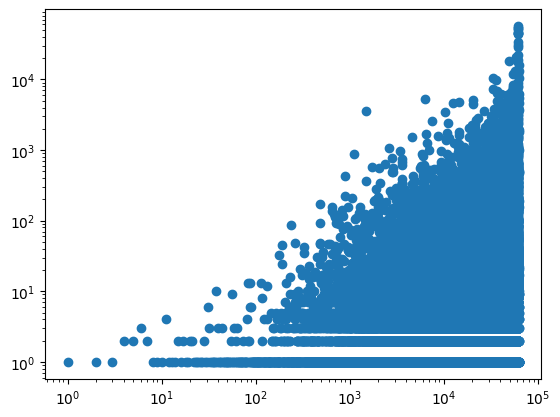

In [13]:
import matplotlib.pyplot as plt

keys = list(agg.keys())
keys.sort(key=lambda item: (-len(item), item))

occurences = []
for key in keys:
    occurences.append(agg[key])

x = range(1,len(occurences)+1)
y = occurences

plt.plot(x, y, 'o')
plt.yscale('log')
plt.xscale('log')
plt.show()

8. Install [Morfeusz](http://morfeusz.sgjp.pl/download/) (Binding for Python) and use it to find all words that do not
   appear in that dictionary.

9. Find 30 words with the highest ranks that do not belong to the dictionary.

10. Find 30 random words (i.e. shuffle the words) with 5 occurrences that do not belong to the dictionary.

11. Use Levenshtein distance and the frequency list, to determine the most probable correction of the words from
   lists defined in points 8 and 9. (**Note**: You don't have to apply the distance directly. Any method that is more efficient than scanning the
   dictionary will be appreciated.)

12. Load [SGJP dictionary](http://morfeusz.sgjp.pl/download/) (Słownik SGJP dane tekstowe) to ElasticSearch (one document for each form) 
   and use fuzzy matching to obtain the possible corrections of the 30 words with 5 occurrences that do not belong to the dictionary.

13. Compare the results of your algorithm and output of ES.

14. Draw conclusions regarding:
   * the distribution of words in the corpus,
   * the number of true misspellings vs. the number of unknown words,
   * the performance of your method compared to ElasticSearch,
   * the results provided by your method compared to ElasticSearch,
   * the validity of the obtained corrections.